# Visão Computacional - Lista de Exercícios 2
Alunos:
- Luana Júlia Nunes Ferreira
- Lucas Mendes Massa

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

# Questão 1

In [2]:
car1 = cv2.imread('./car1.jpg')
car2 = cv2.imread('./car2.jpg')
cube1 = cv2.imread('./cube1.jpg')
cube2 = cv2.imread('./cube2.jpg')
plane1 = cv2.imread('./plane1.jpg')
plane2 = cv2.imread('./plane2.jpg')

In [3]:
car1 = cv2.cvtColor(car1,cv2.COLOR_BGR2RGB)
car2 = cv2.cvtColor(car2,cv2.COLOR_BGR2RGB)
cube1 = cv2.cvtColor(cube1,cv2.COLOR_BGR2RGB)
cube2 = cv2.cvtColor(cube2,cv2.COLOR_BGR2RGB)
plane1 = cv2.cvtColor(plane1,cv2.COLOR_BGR2RGB)
plane2 = cv2.cvtColor(plane2,cv2.COLOR_BGR2RGB)

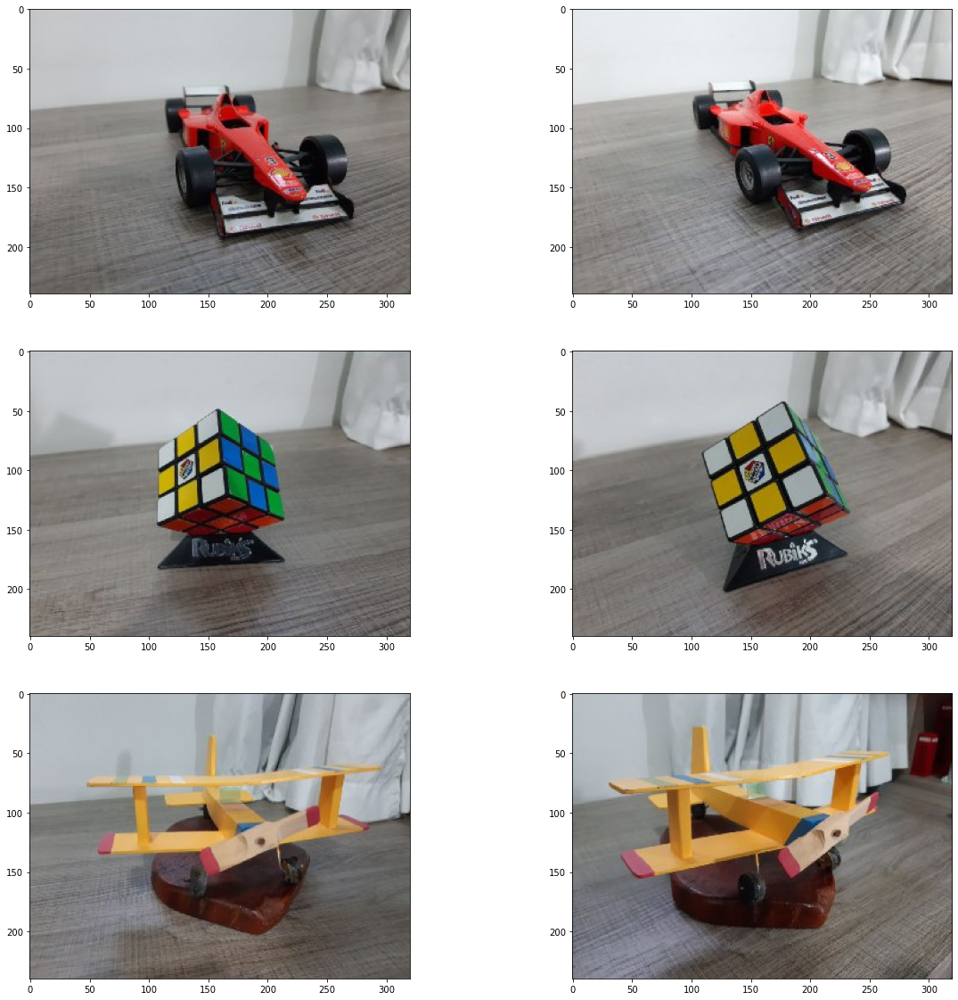

In [4]:
f, axarr = plt.subplots(3,2, figsize=(20,20))
axarr[0,0].imshow(car1)
axarr[0,1].imshow(car2)
axarr[1,0].imshow(cube1)
axarr[1,1].imshow(cube2)
axarr[2,0].imshow(plane1)
axarr[2,1].imshow(plane2)

### Detector de Harris

In [5]:
def runHarrisDetector(img,bs,ks,k,t):
    img = img.copy()
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    h = cv2.cornerHarris(gray,bs,ks,k)
    img[h>t*h.max()]=[255,0,0]
    return img

In [6]:
car1_harris = runHarrisDetector(car1,2,3,0.04,0.01)
car2_harris = runHarrisDetector(car2,2,3,0.04,0.01)
cube1_harris = runHarrisDetector(cube1,2,3,0.04,0.01)
cube2_harris = runHarrisDetector(cube2,2,3,0.04,0.01)
plane1_harris = runHarrisDetector(plane1,2,3,0.04,0.01)
plane2_harris = runHarrisDetector(plane2,2,3,0.04,0.01)

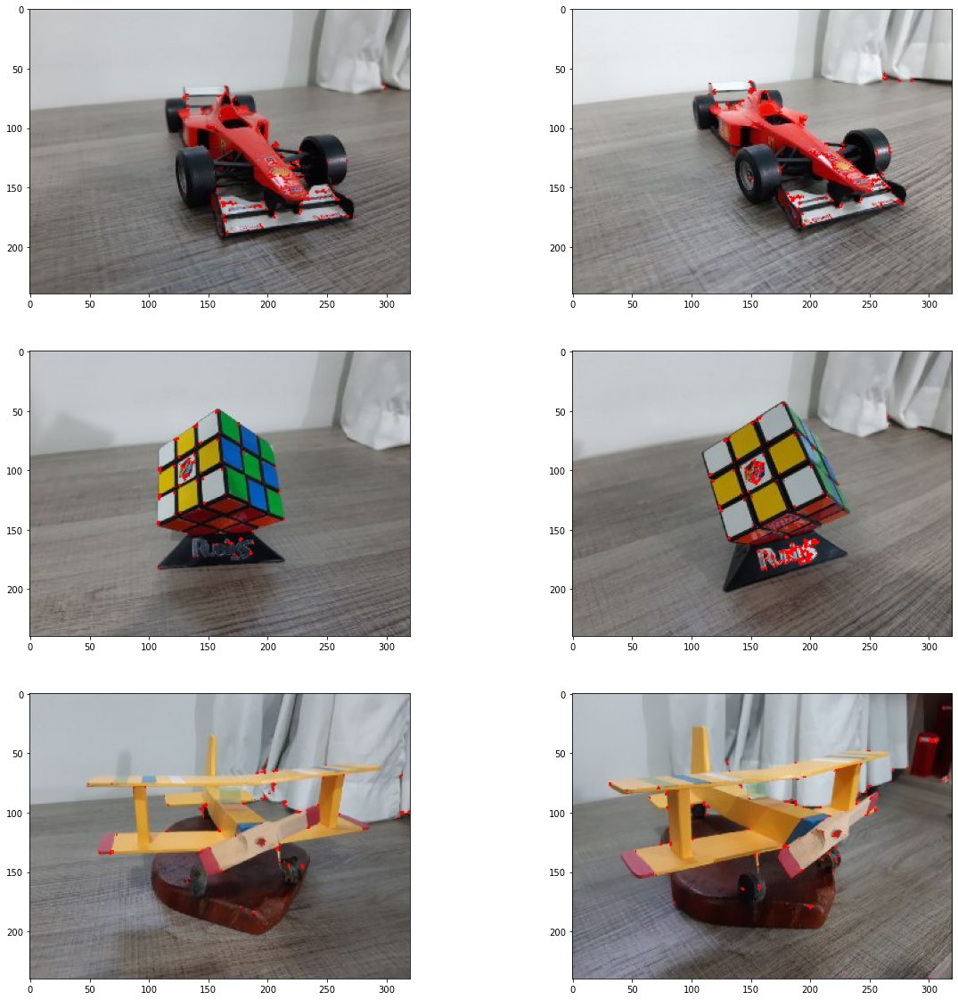

In [7]:
f, axarr = plt.subplots(3,2, figsize=(20,20))
axarr[0,0].imshow(car1_harris)
axarr[0,1].imshow(car2_harris)
axarr[1,0].imshow(cube1_harris)
axarr[1,1].imshow(cube2_harris)
axarr[2,0].imshow(plane1_harris)
axarr[2,1].imshow(plane2_harris)

### Detector Shi-Tomasi

In [8]:
def runShiTomasi(img,mc,q,md):
    img = img.copy()
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    st = cv2.goodFeaturesToTrack(gray,mc,q,md)
    st = np.int0(st)
    for i in st:
        x,y = i.ravel()
        cv2.circle(img,(x,y),2,255,-1)
    return img

In [9]:
car1_shi = runShiTomasi(car1,50,0.01,5)
car2_shi = runShiTomasi(car2,50,0.01,5)
cube1_shi = runShiTomasi(cube1,50,0.01,5)
cube2_shi = runShiTomasi(cube2,50,0.01,5)
plane1_shi = runShiTomasi(plane1,50,0.01,5)
plane2_shi = runShiTomasi(plane2,50,0.01,5)

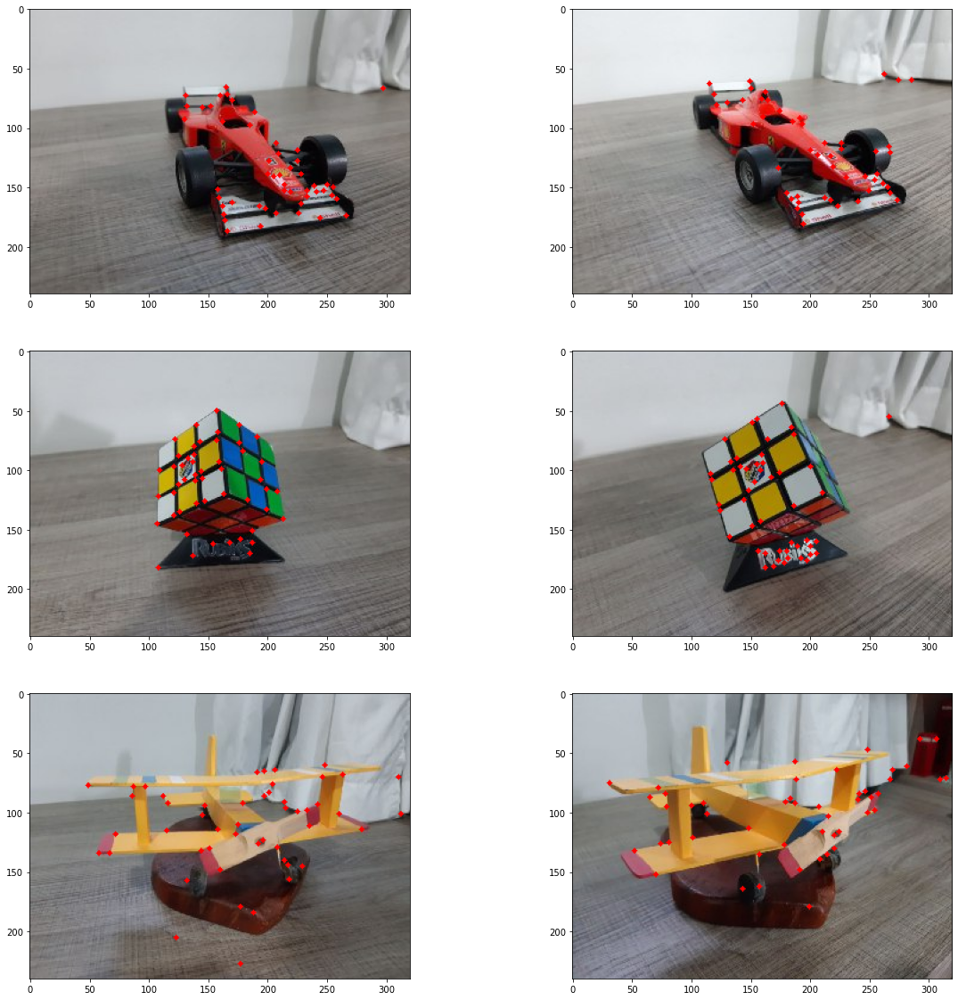

In [10]:
f, axarr = plt.subplots(3,2, figsize=(20,20))
axarr[0,0].imshow(car1_shi)
axarr[0,1].imshow(car2_shi)
axarr[1,0].imshow(cube1_shi)
axarr[1,1].imshow(cube2_shi)
axarr[2,0].imshow(plane1_shi)
axarr[2,1].imshow(plane2_shi)

### Detector FAST

In [11]:
def runFastDetector(img):
    img = img.copy()
    fast = cv2.FastFeatureDetector_create()
    kp = fast.detect(img,None)
    img = cv2.drawKeypoints(img, kp, None, color=(255,0,0))
    return img

In [12]:
car1_fast = runFastDetector(car1)
car2_fast = runFastDetector(car2)
cube1_fast = runFastDetector(cube1)
cube2_fast = runFastDetector(cube2)
plane1_fast = runFastDetector(plane1)
plane2_fast = runFastDetector(plane2)

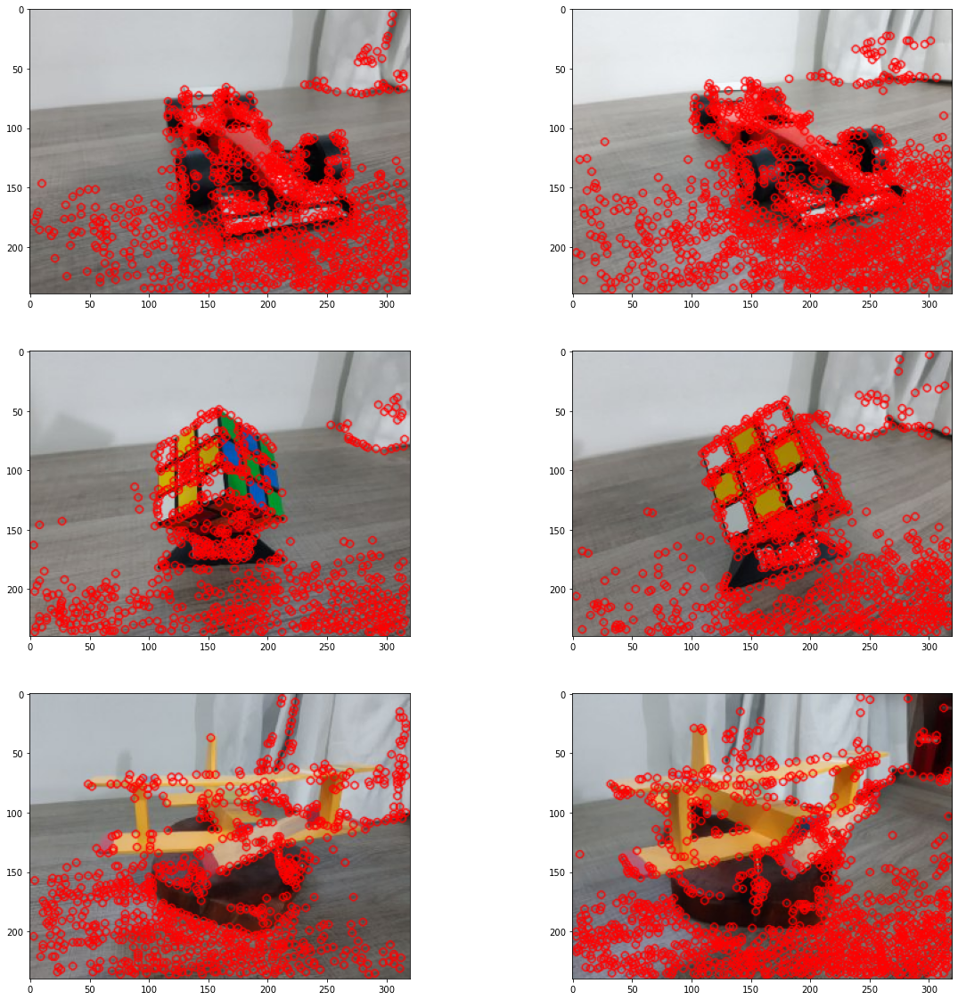

In [13]:
f, axarr = plt.subplots(3,2, figsize=(20,20))
axarr[0,0].imshow(car1_fast)
axarr[0,1].imshow(car2_fast)
axarr[1,0].imshow(cube1_fast)
axarr[1,1].imshow(cube2_fast)
axarr[2,0].imshow(plane1_fast)
axarr[2,1].imshow(plane2_fast)

# Questão 2

### SIFT

In [14]:
def runSIFT(img):
    img = img.copy()
    gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    kp = sift.detect(gray,None)
    img=cv2.drawKeypoints(img,kp,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    return img

In [15]:
car1_sift = runSIFT(car1)
car2_sift = runSIFT(car2)
cube1_sift = runSIFT(cube1)
cube2_sift = runSIFT(cube2)
plane1_sift = runSIFT(plane1)
plane2_sift = runSIFT(plane2)

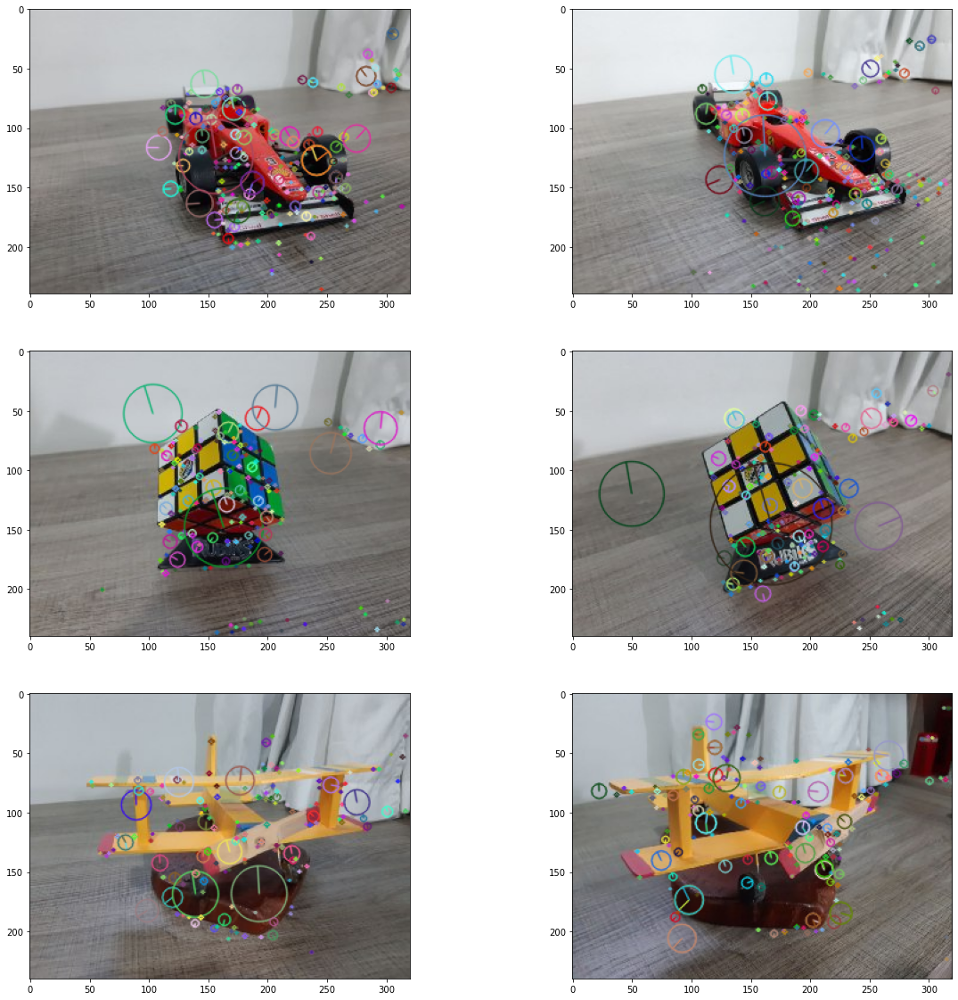

In [16]:
f, axarr = plt.subplots(3,2, figsize=(20,20))
axarr[0,0].imshow(car1_sift)
axarr[0,1].imshow(car2_sift)
axarr[1,0].imshow(cube1_sift)
axarr[1,1].imshow(cube2_sift)
axarr[2,0].imshow(plane1_sift)
axarr[2,1].imshow(plane2_sift)

### BRIEF

In [27]:
def runBRIEF(img):
    img = img.copy()
    star = cv2.xfeatures2d.StarDetector_create()
    brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()
    kp = star.detect(img,None)
    kp, des = brief.compute(img, kp)
    img=cv2.drawKeypoints(img,kp,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    return img

In [28]:
car1_brief = runBRIEF(car1)
car2_brief = runBRIEF(car2)
cube1_brief = runBRIEF(cube1)
cube2_brief = runBRIEF(cube2)
plane1_brief = runBRIEF(plane1)
plane2_brief = runBRIEF(plane2)

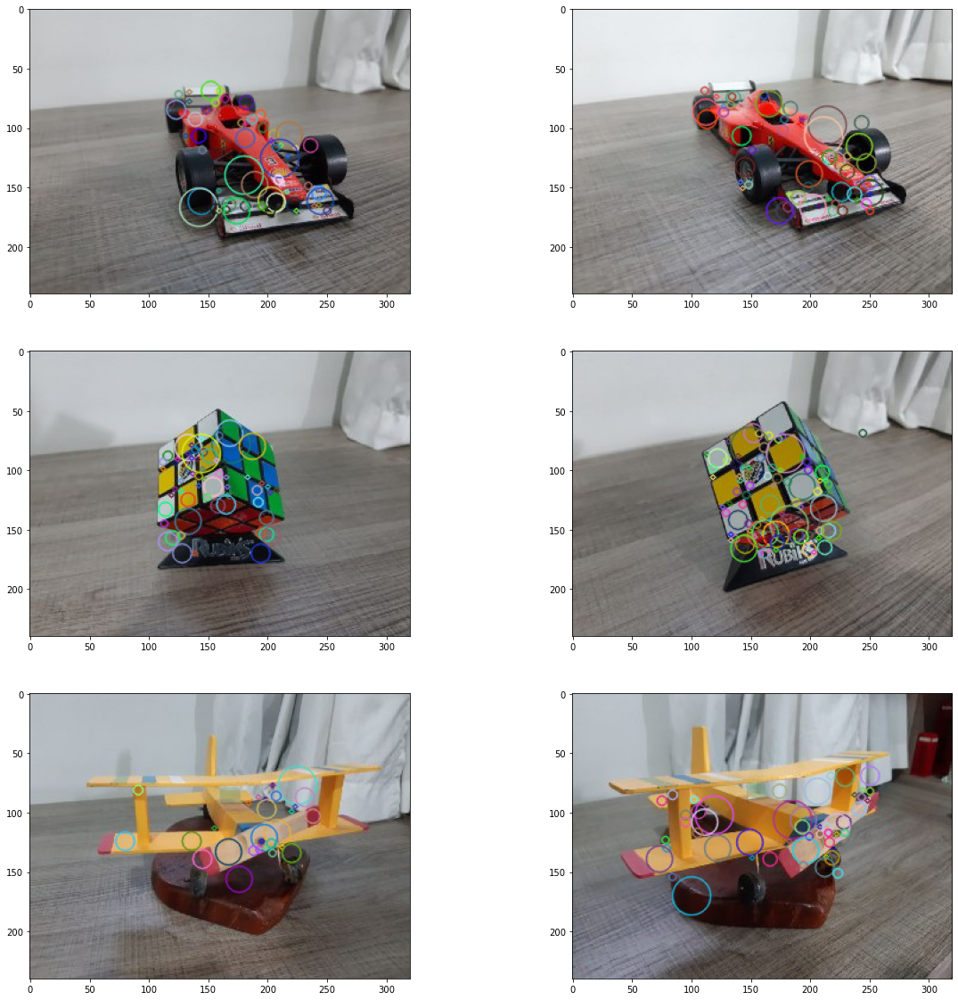

In [29]:
f, axarr = plt.subplots(3,2, figsize=(20,20))
axarr[0,0].imshow(car1_brief)
axarr[0,1].imshow(car2_brief)
axarr[1,0].imshow(cube1_brief)
axarr[1,1].imshow(cube2_brief)
axarr[2,0].imshow(plane1_brief)
axarr[2,1].imshow(plane2_brief)

### ORB

In [45]:
def runORB(img):
    img = img.copy()
    orb = cv2.ORB_create()
    kp = orb.detect(img,None)
    kp, des = orb.compute(img, kp)
    img=cv2.drawKeypoints(img,kp,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    return img

In [46]:
car1_orb = runORB(car1)
car2_orb = runORB(car2)
cube1_orb = runORB(cube1)
cube2_orb = runORB(cube2)
plane1_orb = runORB(plane1)
plane2_orb = runORB(plane2)

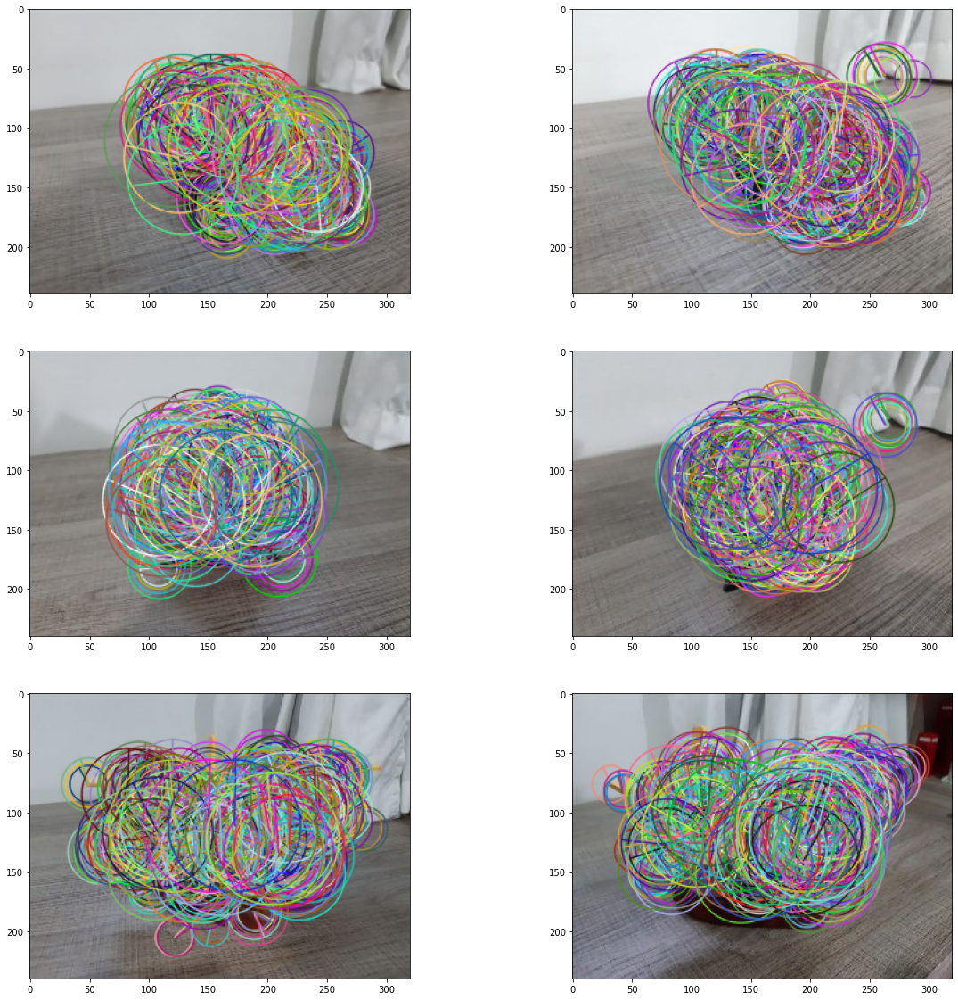

In [47]:
f, axarr = plt.subplots(3,2, figsize=(20,20))
axarr[0,0].imshow(car1_orb)
axarr[0,1].imshow(car2_orb)
axarr[1,0].imshow(cube1_orb)
axarr[1,1].imshow(cube2_orb)
axarr[2,0].imshow(plane1_orb)
axarr[2,1].imshow(plane2_orb)